Imporitng the neccessary libraries

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from collections import Counter

In [2]:
from sklearn.model_selection import (
    train_test_split, cross_val_score, StratifiedKFold, learning_curve
)
from sklearn.preprocessing import StandardScaler, label_binarize
from sklearn.impute import SimpleImputer
from sklearn.metrics import (
    accuracy_score, classification_report, roc_curve, auc, r2_score, mean_squared_error
)
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.inspection import permutation_importance

In [3]:
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    RandomForestClassifier, GradientBoostingClassifier, RandomForestRegressor
)
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC, SVR
from sklearn.neural_network import MLPClassifier

In [4]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Conv1D, Flatten, MaxPooling1D
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import regularizers, Input

In [5]:
from imblearn.over_sampling import SMOTE
import networkx as nx
from networkx.algorithms import community

from catboost import CatBoostClassifier
from sklearn.multiclass import OneVsRestClassifier

Upload the data set and clean it

In [6]:
df_cleaned = pd.read_csv("data/communities.data", header=None, na_values=["?"])

TARGET_COL = 'ViolentCrimesPerPop'

with open("data/communities.names") as f:
    lines = f.readlines()
column_names = [line.split()[1] for line in lines if line.startswith("@attribute")]
df_cleaned.columns = column_names[:df_cleaned.shape[1]]

first_5_cols = df_cleaned.columns[:5].tolist()

nan_threshold = 0.5 * len(df_cleaned)
nan_cols = df_cleaned.columns[df_cleaned.isna().sum() > nan_threshold].tolist()
if TARGET_COL in nan_cols:
    nan_cols.remove(TARGET_COL)

df_to_drop = first_5_cols + nan_cols
df_final = df_cleaned.drop(columns=df_to_drop)

percentage_cols = [col for col in df_final.columns if 'pct' in col.lower()]
if TARGET_COL in df_final.columns:
    percentage_cols.append(TARGET_COL)

df_final = df_final[percentage_cols]

print(f"Cleaned data set: {df_final.shape}")
df_final.head()

Cleaned data set: (1994, 68)


,racepctblack,racePctWhite,racePctAsian,racePctHisp,agePct12t21,agePct12t29,agePct16t24,agePct65up,pctUrban,pctWWage,...,MedOwnCostPctInc,MedOwnCostPctIncNoMtg,PctForeignBorn,PctBornSameState,PctSameHouse85,PctSameCity85,PctSameState85,PctUsePubTrans,LemasPctOfficDrugUn,ViolentCrimesPerPop
0,0.02,0.90,0.12,0.17,0.34,0.47,0.29,0.32,1.0,0.72,...,0.46,0.25,0.12,0.42,0.50,0.51,0.64,0.20,0.32,0.20
1,0.12,0.74,0.45,0.07,0.26,0.59,0.35,0.27,1.0,0.72,...,0.32,0.18,0.21,0.50,0.34,0.60,0.52,0.45,0.00,0.67
2,0.49,0.56,0.17,0.04,0.39,0.47,0.28,0.32,0.0,0.58,...,0.39,0.28,0.14,0.49,0.54,0.67,0.56,0.02,0.00,0.43
3,1.00,0.08,0.12,0.10,0.51,0.50,0.34,0.21,1.0,0.89,...,0.51,0.47,0.19,0.30,0.73,0.64,0.65,0.28,0.00,0.12
4,0.02,0.95,0.09,0.05,0.38,0.38,0.23,0.36,0.9,0.72,...,0.51,0.21,0.11,0.72,0.64,0.61,0.53,0.02,0.00,0.03


Forcefully convert every data to numeric 

In [7]:
df_final = df_final.apply(pd.to_numeric, errors='coerce')

Check for any cols with missing values 

In [8]:
missing_cols = df_final.columns[df_final.isnull().any()]
print("Columns with missing values:")
print(missing_cols.tolist())

Columns with missing values:
[]


Filling the missing values with RandomForestRegression

In [9]:
df_numeric = df_final.select_dtypes(include=[np.number])

for col in df_numeric.columns[df_numeric.isna().any()]:
    not_null = df_numeric[df_numeric[col].notnull()]
    is_null = df_numeric[df_numeric[col].isnull()]

    if len(not_null) < 50 or len(is_null) == 0:
        print(f"Skipping '{col}' due to insufficient data.")
        continue

    X_train = not_null.drop(columns=[col]).fillna(not_null.mean())
    y_train = not_null[col]
    X_pred = is_null.drop(columns=[col]).fillna(not_null.mean())

    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_model.fit(X_train, y_train)
    y_pred = rf_model.predict(X_pred)

    df_final.loc[df_final[col].isnull(), col] = y_pred
    print(f"Filled {len(y_pred)} missing values in '{col}' using Random Forest.")

Another missing data check

In [10]:
missing = df_final.isnull().sum().sum()

if missing == 0:
    print("No missing values remained in the dataset.")
else:
    print(f"There are still {missing} missing values in the dataset.")

No missing values remained in the dataset.


Save the cleaned dataset to csv

In [11]:
df_final.to_csv("communities_percentages_cleaned.csv", index=False)

Generating the Correlation Matrix

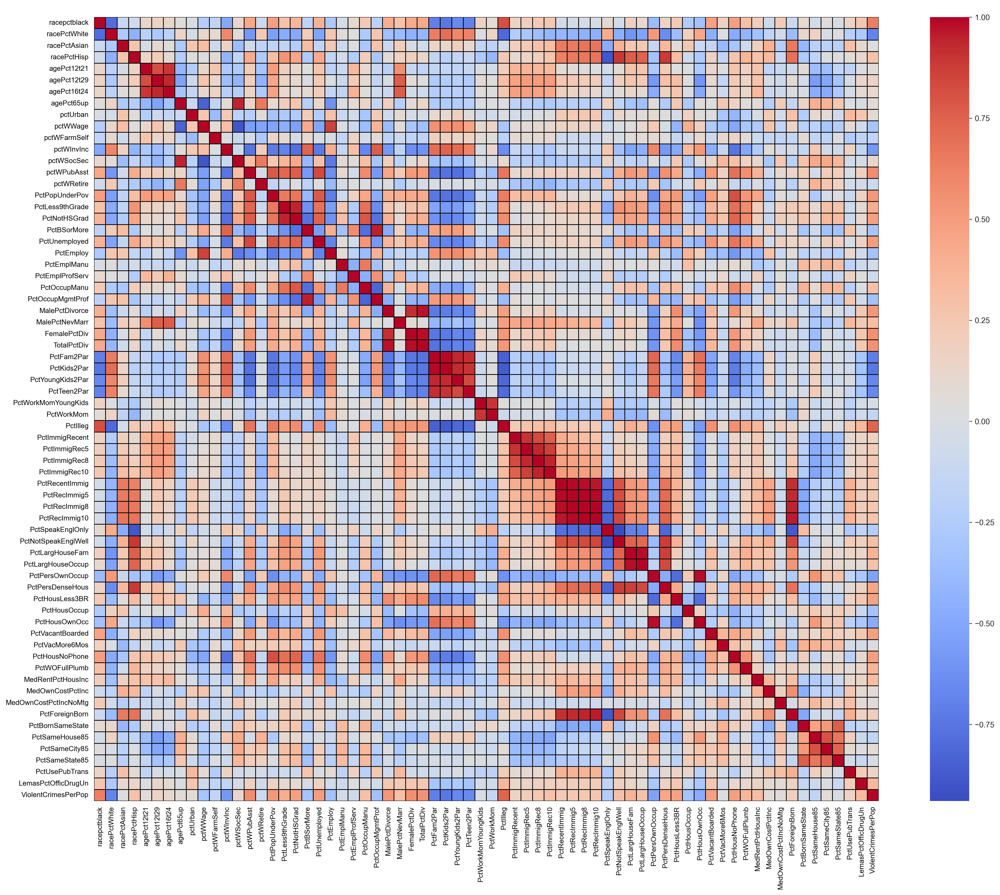

In [12]:
correlations = df_final.corr(numeric_only=True)

fig, ax = plt.subplots(figsize=(20, 16), dpi=300, facecolor='white')

sns.heatmap(
    correlations,
    cmap='coolwarm',
    cbar=True,
    ax=ax,
    linewidths=0.5,
    linecolor='black',
    square=True,
    xticklabels=True,
    yticklabels=True
)

ax.set_facecolor('white')
ax.tick_params(colors='black', labelsize=9)
plt.title("Tüm Değişkenler Arası Korelasyon Matrisi", color='white')

os.makedirs("figures", exist_ok=True)

plt.tight_layout()
plt.savefig("figures/correlation_matrix.png", facecolor=fig.get_facecolor())
plt.show()

correlations.to_excel("data/correlation_rates.xlsx")

Generating the Heatmap

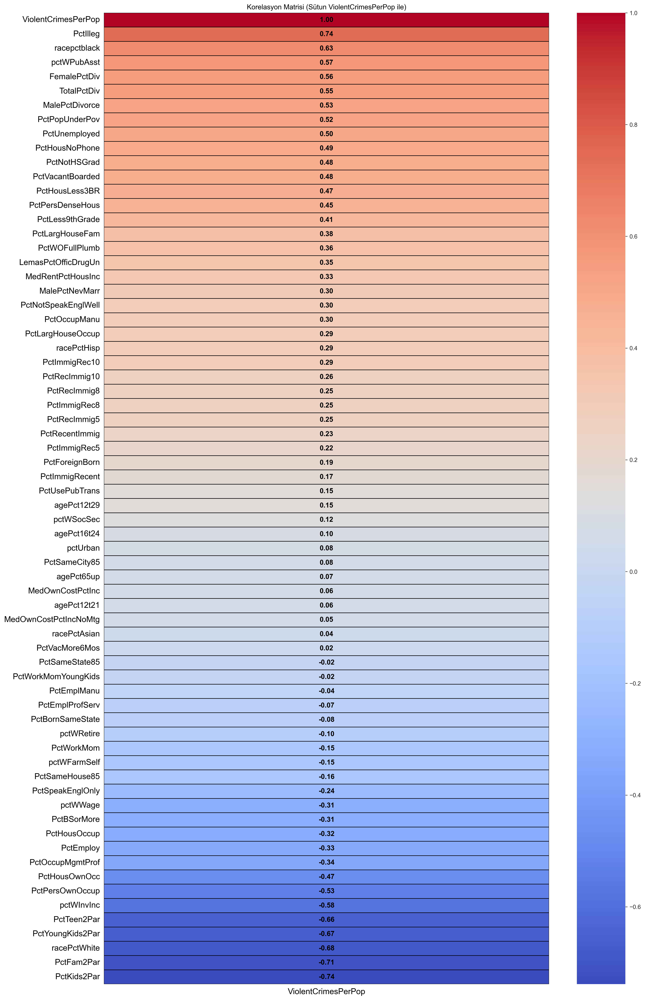

In [13]:
if TARGET_COL not in correlations.columns:
    correlations[TARGET_COL] = df_final[TARGET_COL]
    
target_corr = correlations[[TARGET_COL]].sort_values(by=TARGET_COL, ascending=False)

fig, ax = plt.subplots(figsize=(16, 24), dpi=300, facecolor='white')

sns.heatmap(
    target_corr,
    cmap='coolwarm',
    annot=True,                 
    fmt=".2f",                 
    cbar=True,
    ax=ax,
    linewidths=0.5,
    linecolor='black',
    xticklabels=True,
    yticklabels=True,
    annot_kws={"size": 12, "color": "black", "weight": "bold"}  # 🔥 Font styling
)

ax.set_facecolor('white')
ax.tick_params(colors='black', labelsize=14)
plt.title(f"Korelasyon Matrisi (Sütun {TARGET_COL} ile)", color='black')

plt.tight_layout()
plt.savefig("figures/correlation_matrix_toCrimeRates.png", facecolor=fig.get_facecolor())
plt.show()

target_corr.to_excel(f"data/correlation_to_column{TARGET_COL}.xlsx")


In [14]:
corr_matrix = pd.read_excel("data/correlation_rates.xlsx", index_col=0)

threshold = 0.6

G = nx.Graph()

for col in corr_matrix.columns:
    G.add_node(col)

for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr_val = corr_matrix.iloc[i, j]
        if abs(corr_val) >= threshold:
            G.add_edge(corr_matrix.columns[i], corr_matrix.columns[j], weight=corr_val)

G.remove_nodes_from(list(nx.isolates(G)))

pos = nx.spring_layout(G, seed=42, k=0.8)

communities = community.greedy_modularity_communities(G)
color_map = {}
colors = plt.cm.tab20.colors 

for i, comm in enumerate(communities):
    for node in comm:
        color_map[node] = colors[i % len(colors)]

node_colors = [color_map[node] for node in G.nodes()]

centrality = nx.degree_centrality(G)
node_sizes = [8000 + 20000 * centrality[n] for n in G.nodes()]

edges = G.edges(data=True)
edge_colors = ['#ff6666' if d['weight'] < 0 else '#66ff99' for (_, _, d) in edges]
edge_weights = [2.5 if abs(d['weight']) >= 0.8 else 1.5 for (_, _, d) in edges]

plt.figure(figsize=(34, 26), dpi=300, facecolor='white')

nx.draw_networkx_nodes(G, pos, node_color=node_colors, node_size=node_sizes, alpha=0.9)
nx.draw_networkx_edges(G, pos, edge_color=edge_colors, width=edge_weights, alpha=0.8)
nx.draw_networkx_labels(G, pos, font_size=12, font_color='black', font_weight='bold')

edge_labels = {(u, v): f"{d['weight']:.2f}" for u, v, d in edges}

plt.title(f"Correlation Network (Threshold > {threshold})", fontsize=20, color='black')
plt.axis('off')
plt.tight_layout()
plt.savefig("figures/correlation_graph.png", dpi=300, facecolor='white')
plt.show()


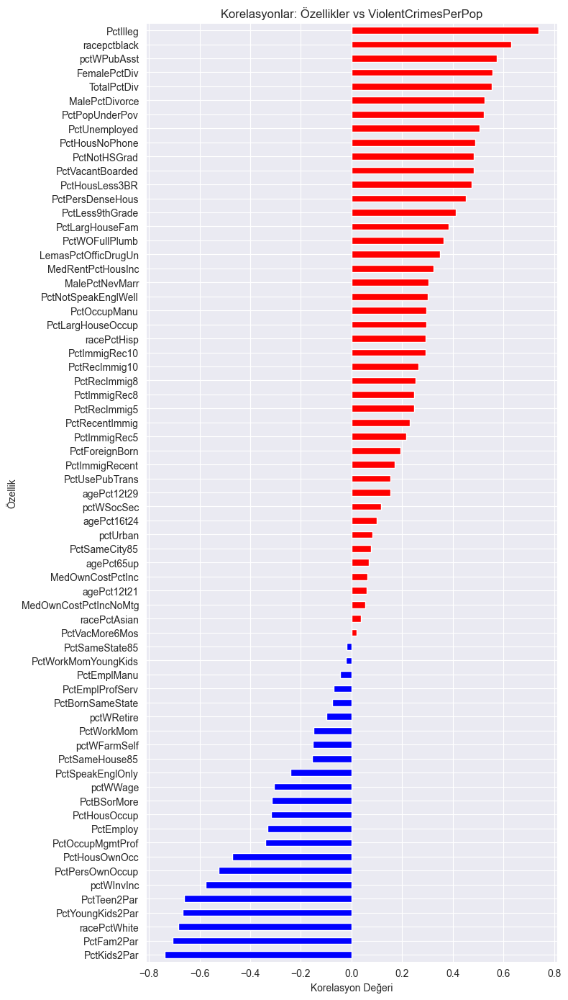

In [15]:
corr_df = pd.read_excel(f"data/correlation_to_column{TARGET_COL}.xlsx", index_col=0)


corr_df.index = corr_df.index.map(str)
target_col = str(TARGET_COL)

corr_series = corr_df.loc[
    (corr_df.index != target_col),
    target_col
].sort_values()

colors = ['red' if val > 0 else 'blue' for val in corr_series]

plt.figure(figsize=(8, 14))
corr_series.plot(kind='barh', color=colors)
plt.title(f"Korelasyonlar: Özellikler vs {target_col}")
plt.xlabel("Korelasyon Değeri")
plt.ylabel("Özellik")
plt.tight_layout()
plt.savefig("figures/correlation_bar_plot_excluding_ViolentCrimesPerPop.png", dpi=300)
plt.show()


RandomForestRegressor

In [16]:
randomForest_feature_importance = pd.read_csv("communities_percentages_cleaned.csv")
randomForest_feature_importance.shape

(1994, 68)

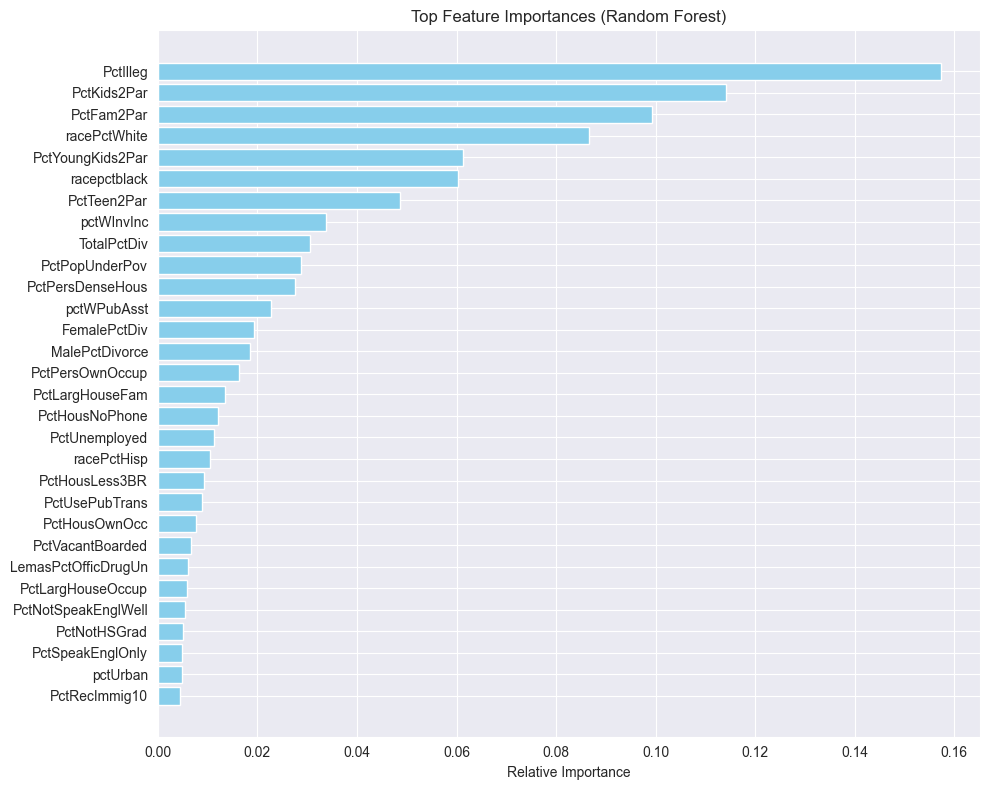

In [17]:
randomForest_feature_importance = pd.read_csv("communities_percentages_cleaned.csv")

X = randomForest_feature_importance.drop(columns=[TARGET_COL])
y = randomForest_feature_importance[TARGET_COL]

rf_model = RandomForestRegressor(n_estimators=200, max_depth=5, max_features="sqrt", bootstrap=False)
rf_model.fit(X, y)

importances = rf_model.feature_importances_
feature_names = X.columns

imp_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values(by='Importance', ascending=False).head(30)

plt.figure(figsize=(10, 8))
plt.barh(imp_df['Feature'], imp_df['Importance'], color='skyblue')
plt.xlabel("Relative Importance")
plt.title("Top Feature Importances (Random Forest)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("figures/random_forest_feature_importances.png", dpi=300)
plt.show()


Veri Hazırlama train ve test split + model eğitme

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

rf_model = RandomForestRegressor(n_estimators=100, max_depth=3, max_features="sqrt", bootstrap=False, random_state=42)
rf_model.fit(X_train, y_train)

y_train_pred = rf_model.predict(X_train)
y_test_pred = rf_model.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Test R² Score:  {test_r2:.4f}")
print(f"Random Forest Regressor Accuracy (R² Score): {test_r2:.4f}")

Train R² Score: 0.6449
Test R² Score:  0.5858
Random Forest Regressor Accuracy (R² Score): 0.5858


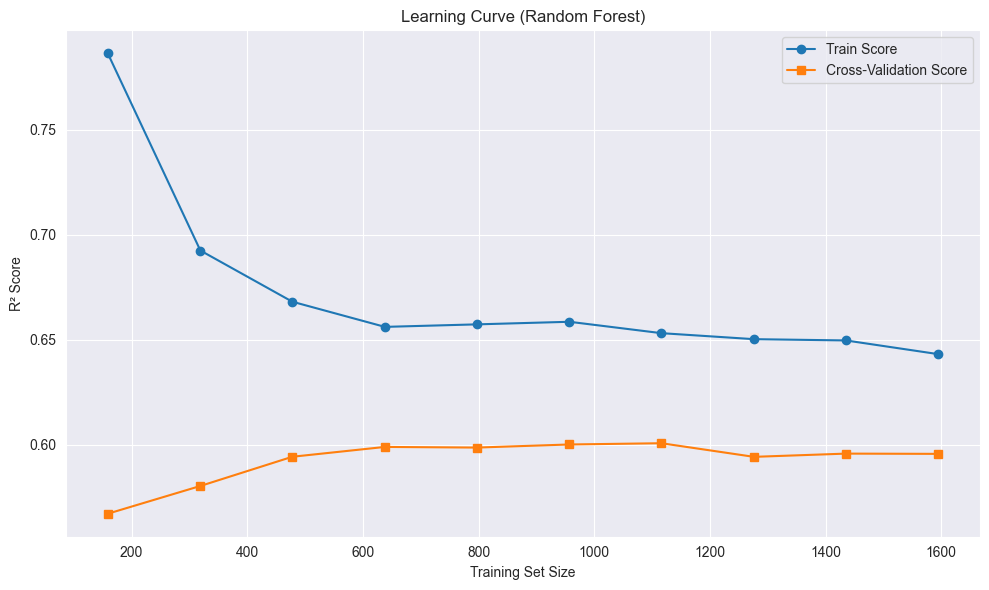

In [19]:
train_sizes, train_scores, test_scores = learning_curve(
    rf_model, X, y, cv=5, scoring='r2', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10), random_state=42
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label="Train Score", marker='o')
plt.plot(train_sizes, test_scores_mean, label="Cross-Validation Score", marker='s')
plt.title("Learning Curve (Random Forest)")
plt.xlabel("Training Set Size")
plt.ylabel("R² Score")
plt.legend(loc="best")
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/random_forest_learning_curve.png", dpi=300)
plt.show()


Linear Regression

In [20]:
feature_names = feature_names.astype(str)

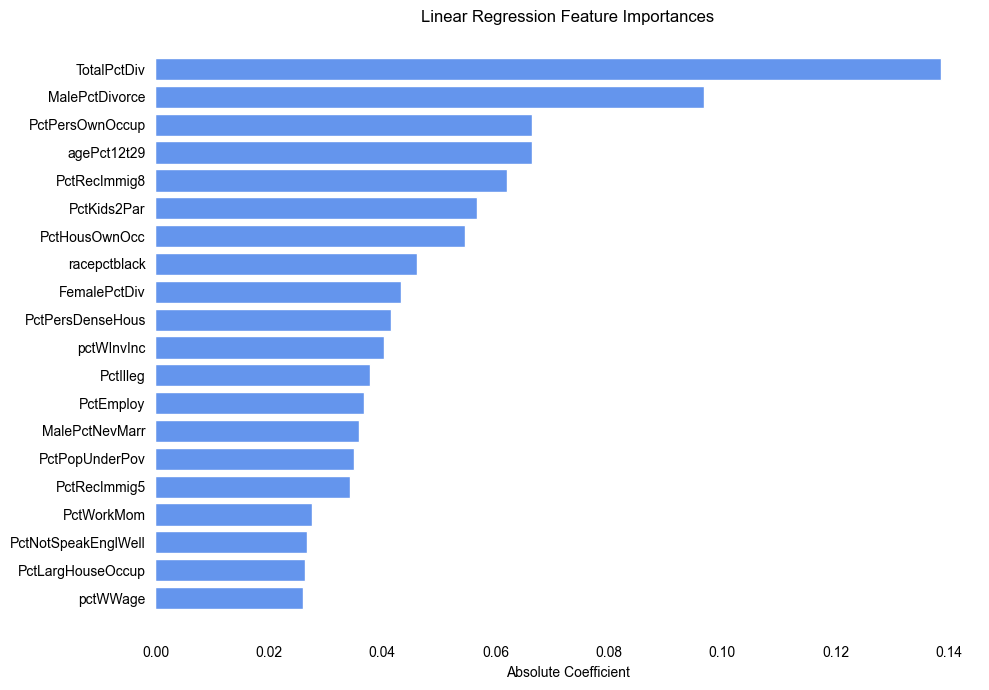

In [21]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

lr_model = LinearRegression()
lr_model.fit(X_scaled, y)

importances = np.abs(lr_model.coef_)
imp_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
imp_df = imp_df.sort_values(by='Importance', ascending=False).head(20)

fig, ax = plt.subplots(figsize=(10, 7), facecolor='white')

ax.barh(imp_df['Feature'], imp_df['Importance'], color='cornflowerblue')
ax.set_title("Linear Regression Feature Importances", color='black')
ax.set_xlabel("Absolute Coefficient", color='black')
ax.set_facecolor('white') 
ax.tick_params(colors='black') 
ax.invert_yaxis()

plt.tight_layout()
plt.savefig("figures/feature_importance_linear_regression.png", dpi=300, facecolor='white')
plt.show()

Train and test accuracy

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

y_train_pred = lr_model.predict(X_train)
y_test_pred = lr_model.predict(X_test)

train_r2 = r2_score(y_train, y_train_pred)
test_r2 = r2_score(y_test, y_test_pred)

print(f"Train R² Score: {train_r2:.4f}")
print(f"Test R² Score:  {test_r2:.4f}")
print(f"Linear Regression Test Accuracy (R² Score): {test_r2:.4f}")

Train R² Score: 0.6769
Test R² Score:  0.6241
Linear Regression Test Accuracy (R² Score): 0.6241


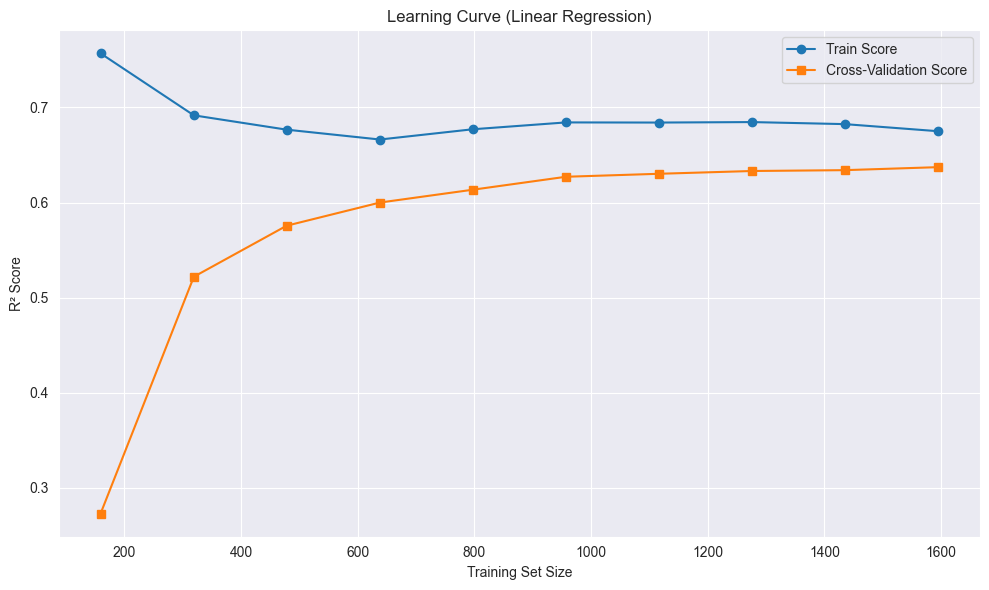

In [23]:
train_sizes, train_scores, test_scores = learning_curve(
    lr_model, X_scaled, y, cv=5, scoring='r2', train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

train_scores_mean = np.mean(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores_mean, label="Train Score", marker='o')
plt.plot(train_sizes, test_scores_mean, label="Cross-Validation Score", marker='s')
plt.title("Learning Curve (Linear Regression)")
plt.xlabel("Training Set Size")
plt.ylabel("R² Score")
plt.legend(loc="best")
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_linear_regression.png", dpi=300)
plt.show()

Support Vector Regressor

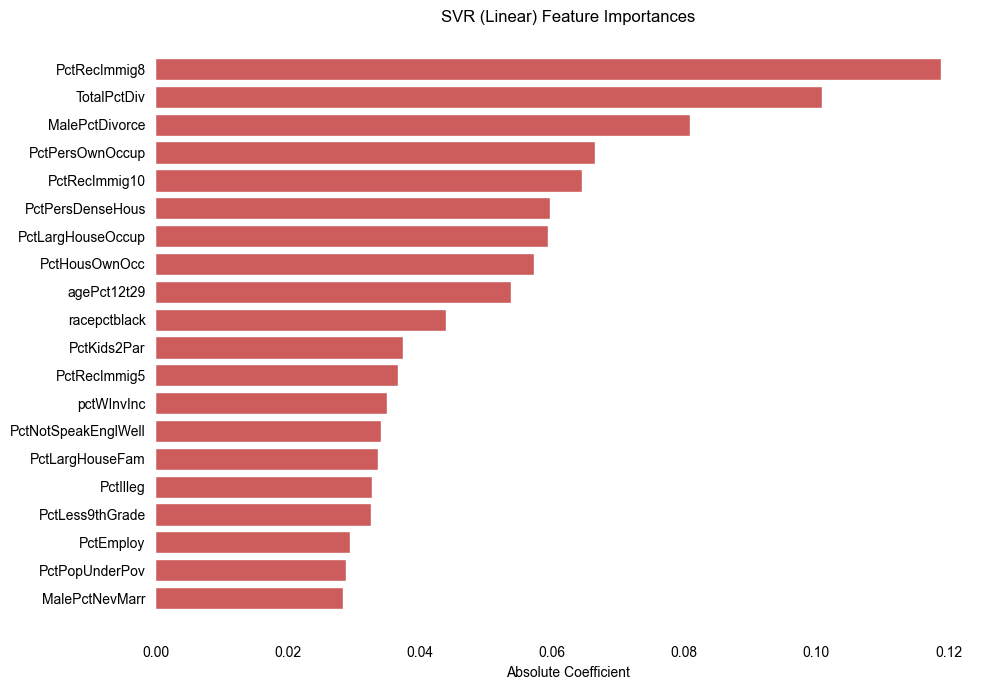

In [24]:
# Modeli eğit
svm_model = SVR(kernel='linear')
svm_model.fit(X_scaled, y)

# Katsayıların mutlak değeri
importances = np.abs(svm_model.coef_.flatten())
imp_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
imp_df = imp_df.sort_values(by='Importance', ascending=False).head(20)

# Grafik (düzenlenmiş)
fig, ax = plt.subplots(figsize=(10, 7), facecolor='white')

ax.barh(imp_df['Feature'], imp_df['Importance'], color='indianred')
ax.set_title("SVR (Linear) Feature Importances", color='black')
ax.set_xlabel("Absolute Coefficient", color='black')
ax.set_facecolor('white')
ax.tick_params(colors='black')
ax.invert_yaxis()

plt.tight_layout()
plt.savefig("figures/feature_importance_svr_linear.png", dpi=300, facecolor='white')
plt.show()

SVR Train R²: 0.6566
SVR Test R²:  0.6342


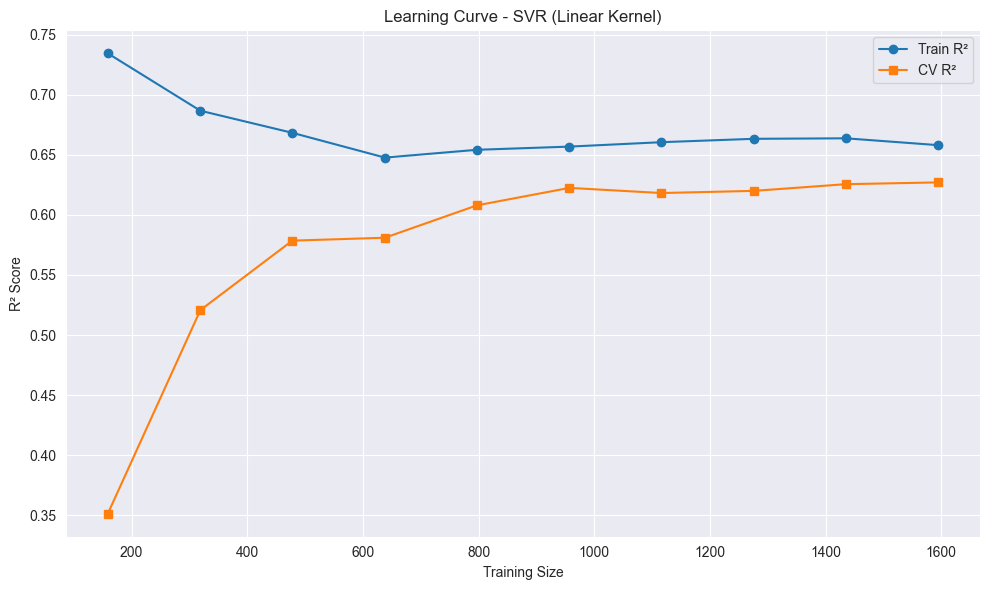

In [172]:
df = pd.read_csv("communities_percentages_cleaned.csv")

df["CrimeLevel"] = pd.qcut(df[TARGET_COL], q=5, labels=[0, 1, 2, 3, 4]) 

corr_df = pd.read_excel(f"data/correlation_to_column{TARGET_COL}.xlsx", index_col=0)
top_features = corr_df[abs(corr_df.iloc[:, 0]) > 0.3].index.astype(str).tolist()
top_features = [f for f in top_features if f != "100"]
feature_names = top_features


X_scaled = StandardScaler().fit_transform(X)
y = df["CrimeLevel"].astype(int)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

svr_model = SVR(kernel='linear')
svr_model.fit(X_train, y_train)

y_train_pred = svr_model.predict(X_train)
y_test_pred = svr_model.predict(X_test)
print(f"SVR Train R²: {r2_score(y_train, y_train_pred):.4f}")
print(f"SVR Test R²:  {r2_score(y_test, y_test_pred):.4f}")

train_sizes, train_scores, test_scores = learning_curve(
    SVR(kernel='linear'), X_scaled, y, cv=5,
    scoring='r2', train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train R²", marker='o')
plt.plot(train_sizes, test_scores.mean(axis=1), label="CV R²", marker='s')
plt.title("Learning Curve - SVR (Linear Kernel)")
plt.xlabel("Training Size")
plt.ylabel("R² Score")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_svr_linear.png", dpi=300)
plt.show()

Classification ile Model Eğitme

Train Accuracy: 0.7620
Test Accuracy:  0.7295


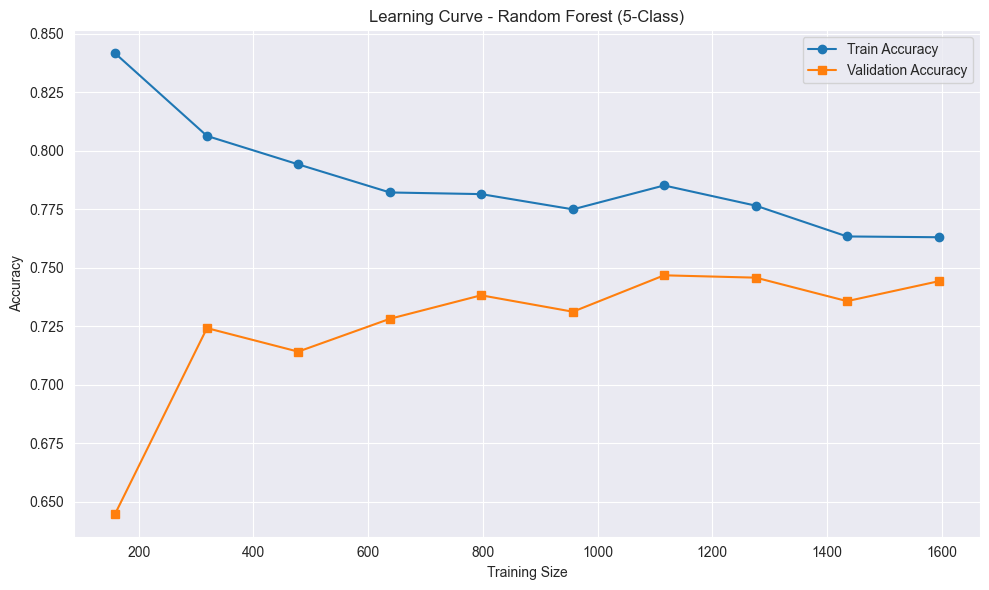

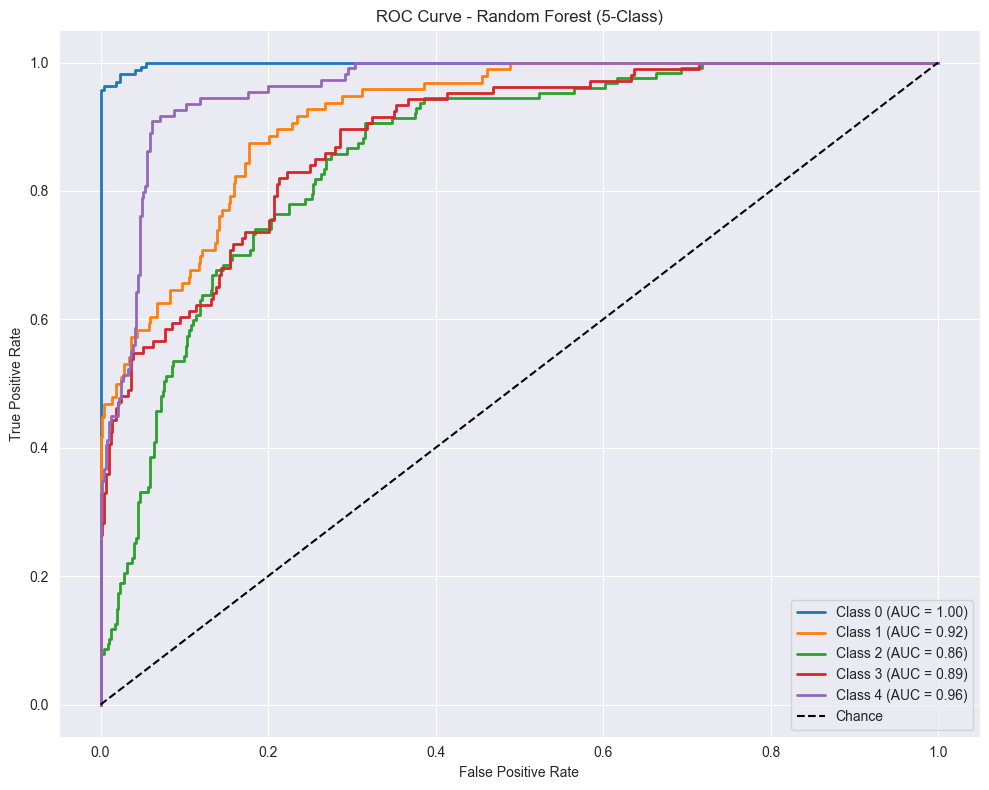

In [26]:
df = pd.read_csv("communities_percentages_cleaned.csv")

df["CrimeLevel"] = pd.qcut(df[TARGET_COL], q=5, labels=[0, 1, 2, 3, 4])  

corr_df = pd.read_excel(f"data/correlation_to_column{TARGET_COL}.xlsx", index_col=0)
top_features = corr_df[abs(corr_df.iloc[:, 0]) > 0.3].index.astype(str).tolist()
top_features = [f for f in top_features if f != "100"]

X = SimpleImputer().fit_transform(df[top_features])
X_scaled = StandardScaler().fit_transform(X)
y = df["CrimeLevel"]

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

clf = RandomForestClassifier(
    n_estimators=50, max_depth=3, min_samples_leaf=4,
    bootstrap=False, max_features="sqrt", random_state=42
)
clf.fit(X_train, y_train)

print(f"Train Accuracy: {accuracy_score(y_train, clf.predict(X_train)):.4f}")
print(f"Test Accuracy:  {accuracy_score(y_test, clf.predict(X_test)):.4f}")


train_sizes, train_scores, test_scores = learning_curve(
    clf, X_scaled, y, cv=5, scoring='accuracy', n_jobs=-1,
    train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train Accuracy", marker='o')
plt.plot(train_sizes, test_scores.mean(axis=1), label="Validation Accuracy", marker='s')
plt.title("Learning Curve - Random Forest (5-Class)")
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_random_forest.png", dpi=300)
plt.show()

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
y_score = clf.predict_proba(X_test)

plt.figure(figsize=(10, 8))
for i in range(5):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
    
plt.plot([0, 1], [0, 1], 'k--', label='Chance')
plt.title("ROC Curve - Random Forest (5-Class)")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_curve_random_forest.png", dpi=300)
plt.show()


Logistic regression

Logistic Regression Accuracy: 0.8297

Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       370
           1       0.59      0.82      0.69       120
           2       0.42      0.12      0.19        64
           3       0.80      0.29      0.42        28
           4       0.85      1.00      0.92        17

    accuracy                           0.83       599
   macro avg       0.72      0.64      0.64       599
weighted avg       0.81      0.83      0.80       599



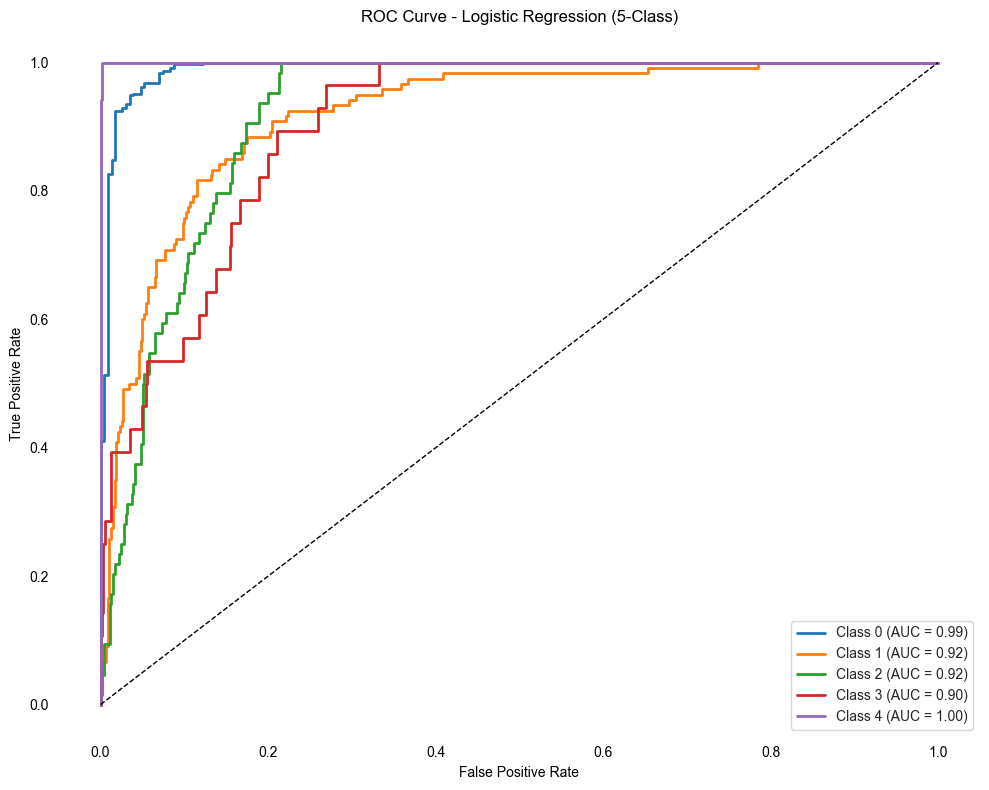

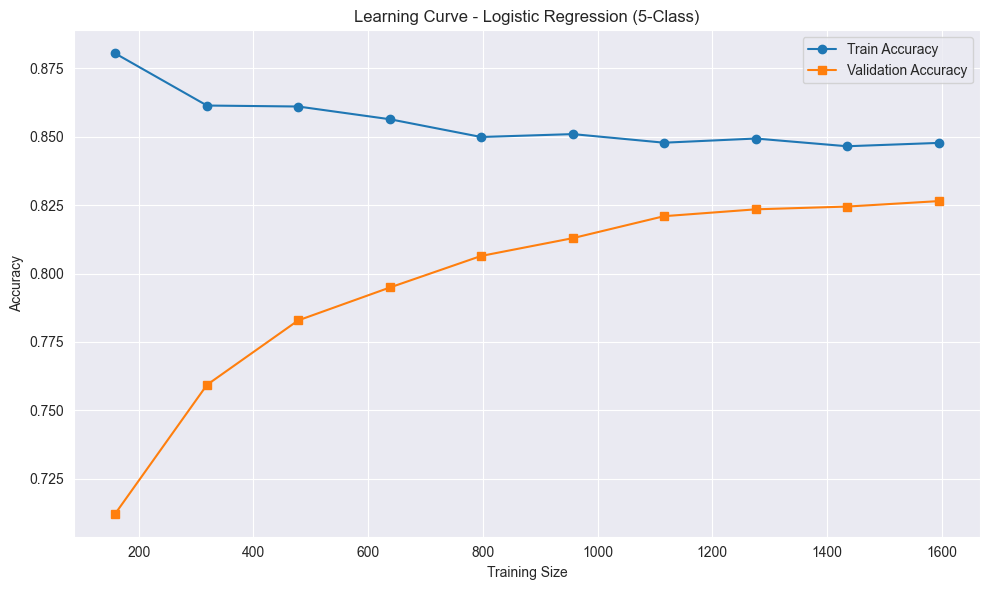

In [27]:
df = pd.read_csv("communities_percentages_cleaned.csv")

def classify(val):
    if val < 0.20: return 0
    elif val < 0.40: return 1
    elif val < 0.60: return 2
    elif val < 0.80: return 3
    else: return 4

df['CrimeLevel'] = df['ViolentCrimesPerPop'].apply(classify)

TARGET_COL = df.columns[-1]
corr_df = pd.read_excel("data/correlation_to_columnViolentCrimesPerPop.xlsx", index_col=0)
corr_df.index = corr_df.index.map(str)
top_features = corr_df[abs(corr_df.iloc[:, 0]) > 0.3].index.tolist()
top_features = [f for f in top_features if f != "100"]

X = df[top_features]
y = df["CrimeLevel"]
X = SimpleImputer(strategy='mean').fit_transform(X)
X_scaled = StandardScaler().fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

model = OneVsRestClassifier(LogisticRegression(C=1, max_iter=1000, random_state=42))
model.fit(X_train, y_train)

y_pred = model.predict(X_test)
y_score = model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"Logistic Regression Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(10, 8), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - Logistic Regression (5-Class)", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right", facecolor='white')
os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/roc_logistic_regression_5class.png", dpi=300, facecolor='white')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(
    model, X_scaled, y, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train Accuracy", marker='o')
plt.plot(train_sizes, test_scores.mean(axis=1), label="Validation Accuracy", marker='s')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Logistic Regression (5-Class)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_logistic_regression_5class.png", dpi=300)
plt.show()


SVM - Classification

SVM Accuracy: 0.9466

Classification Report:

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       370
           1       0.88      0.93      0.90       120
           2       0.88      0.81      0.85        64
           3       0.88      0.82      0.85        28
           4       0.94      1.00      0.97        17

    accuracy                           0.95       599
   macro avg       0.92      0.91      0.91       599
weighted avg       0.95      0.95      0.95       599



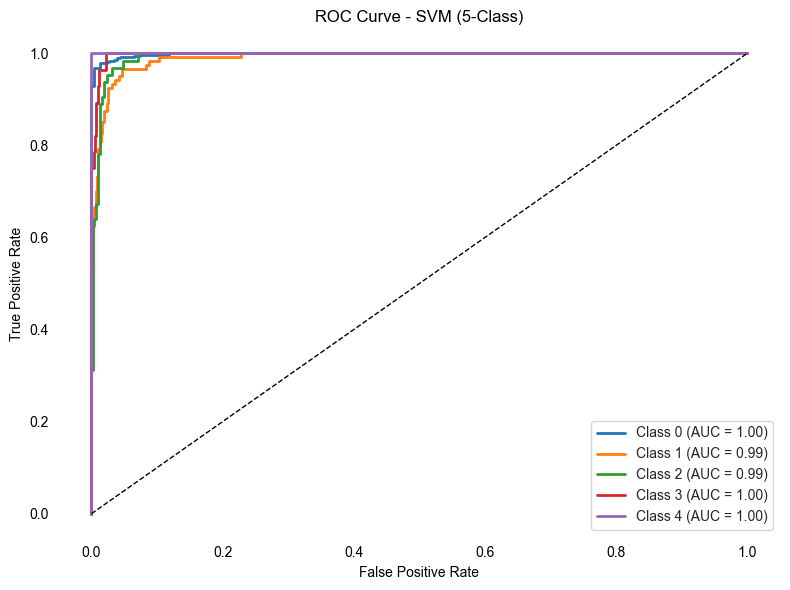

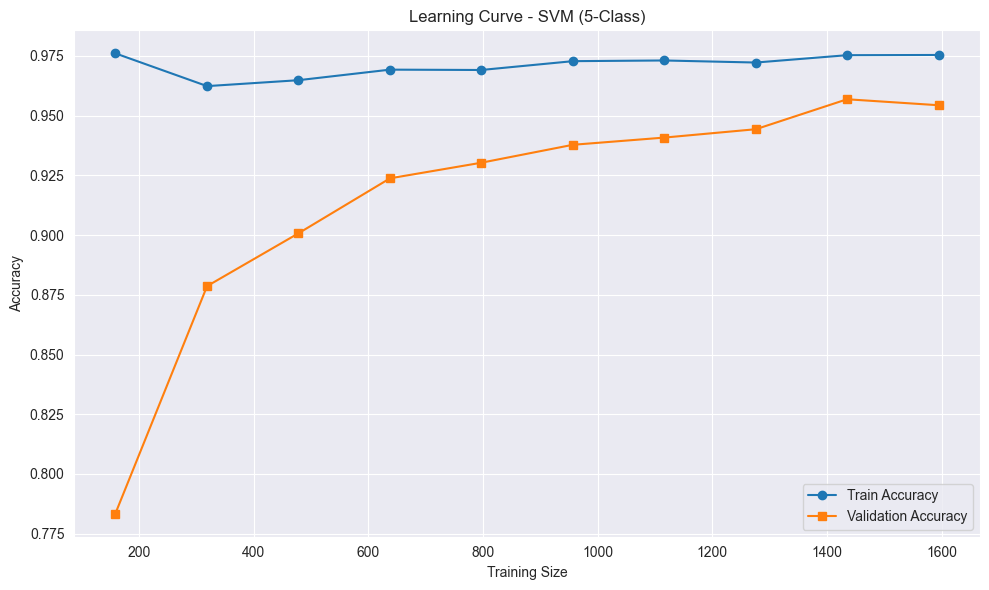

In [28]:
svm_model = SVC(C=0.3, kernel='linear', probability=True, random_state=42)
svm_model.fit(X_train, y_train)

y_pred = svm_model.predict(X_test)
y_score = svm_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"SVM Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - SVM (5-Class)", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right", facecolor='white')
os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/roc_svm.png", dpi=300, facecolor='white')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(
    svm_model, X_scaled, y, cv=5, scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train Accuracy", marker='o')
plt.plot(train_sizes, test_scores.mean(axis=1), label="Validation Accuracy", marker='s')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - SVM (5-Class)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_svm.png", dpi=300)
plt.show()


PairPlot

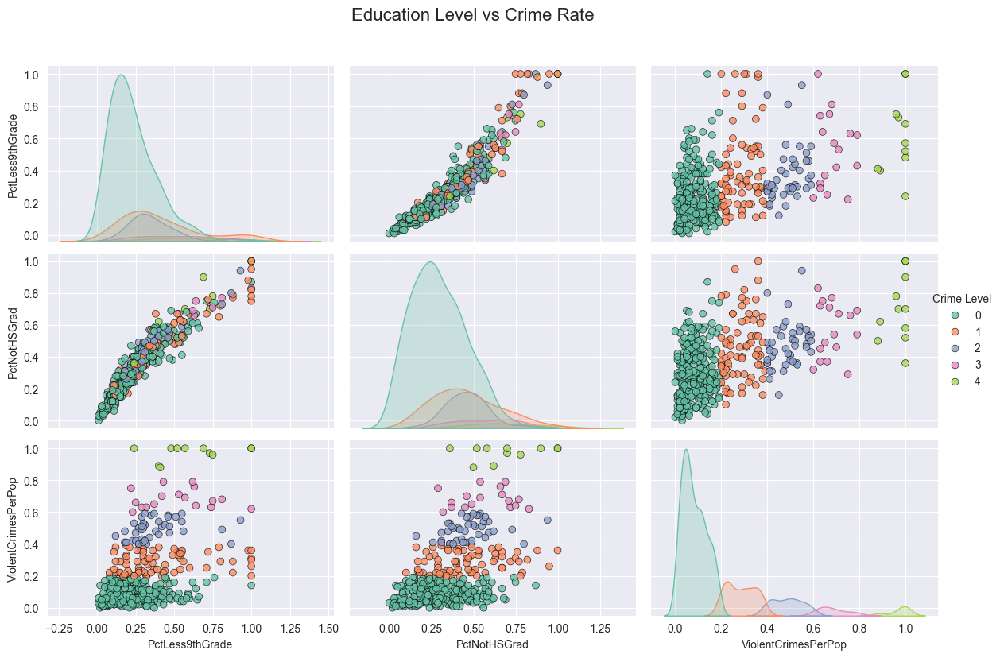

In [29]:
features = ['PctLess9thGrade', 'PctNotHSGrad', 'ViolentCrimesPerPop', 'CrimeLevel']
plot_df = df[features].dropna().sample(n=400, random_state=42)

pair = sns.pairplot(plot_df, hue="CrimeLevel", diag_kind="kde", palette="Set2",
                    height=2.8, plot_kws={'alpha': 0.8, 's': 40, 'edgecolor': 'k'},
                    diag_kws={'fill': True})
pair.fig.suptitle("Education Level vs Crime Rate", fontsize=16, y=1.03)
pair.fig.set_size_inches(12, 8)
pair._legend.set_bbox_to_anchor((1.05, 0.5))
pair._legend.set_title("Crime Level")
plt.tight_layout()
plt.savefig("figures/pairplot_education_vs_crime.png", dpi=300, bbox_inches='tight')
plt.show()


Decision Tree

Decision Tree Accuracy: 0.5943

Classification Report:

              precision    recall  f1-score   support

           0       0.90      0.79      0.84       370
           1       0.40      0.34      0.37       120
           2       0.00      0.00      0.00        64
           3       0.09      0.43      0.15        28
           4       0.28      0.71      0.40        17

    accuracy                           0.59       599
   macro avg       0.34      0.45      0.35       599
weighted avg       0.65      0.59      0.61       599



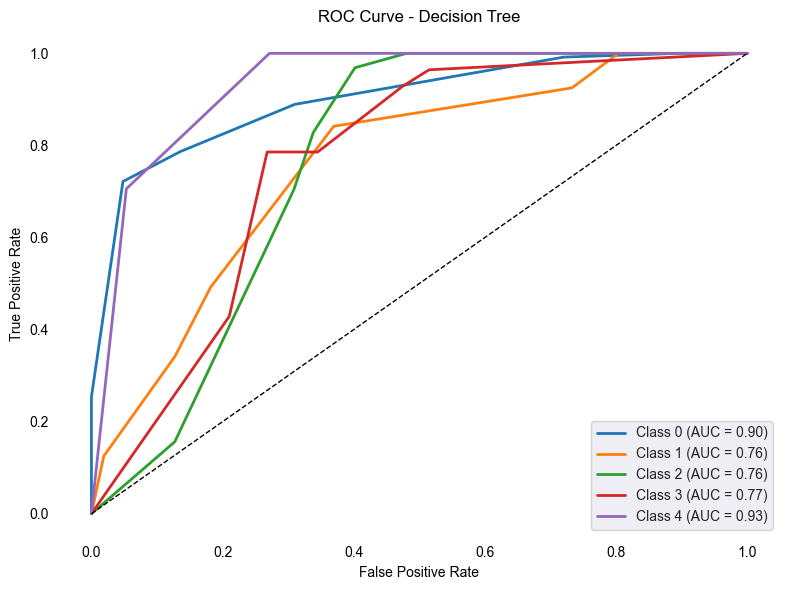

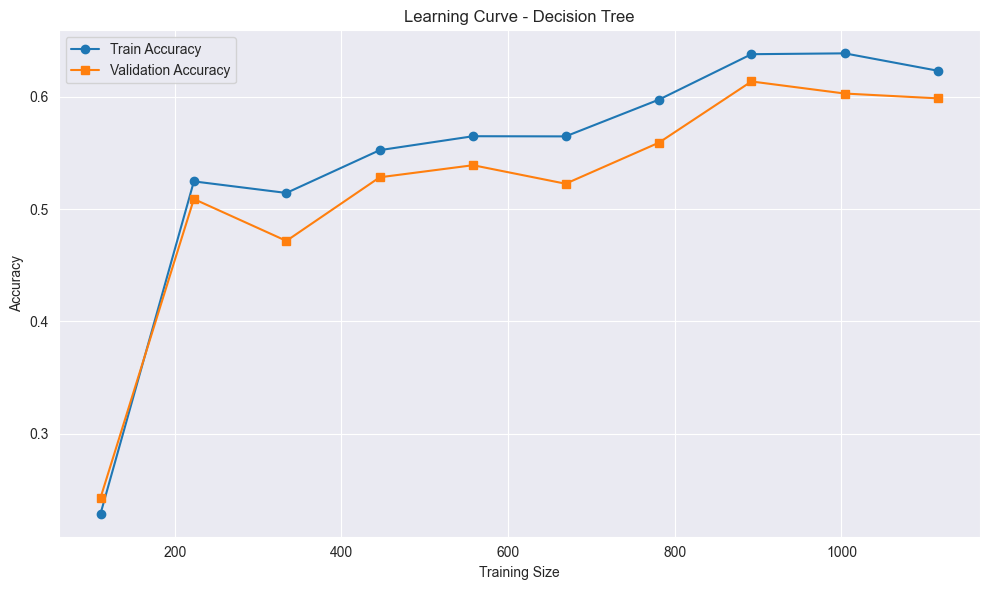

In [30]:
dt_model = DecisionTreeClassifier(
    max_depth=20,
    min_samples_leaf=60,
    min_samples_split=60,
    max_features='log2',
    ccp_alpha=0.01,
    class_weight='balanced',
    random_state=42
)
dt_model.fit(X_train, y_train)

y_pred = dt_model.predict(X_test)
y_score = dt_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, zero_division=0))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - Decision Tree", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/roc_decision_tree.png", dpi=300, facecolor='white')
plt.show()

train_sizes, train_scores, test_scores = learning_curve(
    dt_model, X_train, y_train, cv=5,
    scoring='accuracy', train_sizes=np.linspace(0.1, 1.0, 10), n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_scores.mean(axis=1), label="Train Accuracy", marker='o')
plt.plot(train_sizes, test_scores.mean(axis=1), label="Validation Accuracy", marker='s')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Decision Tree")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_decision_tree.png", dpi=300)
plt.show()

KNN

KNN Accuracy: 0.7429

Classification Report:

              precision    recall  f1-score   support

           0       0.88      0.94      0.91       370
           1       0.47      0.58      0.52       120
           2       0.41      0.22      0.29        64
           3       0.50      0.07      0.12        28
           4       0.69      0.65      0.67        17

    accuracy                           0.74       599
   macro avg       0.59      0.49      0.50       599
weighted avg       0.72      0.74      0.72       599



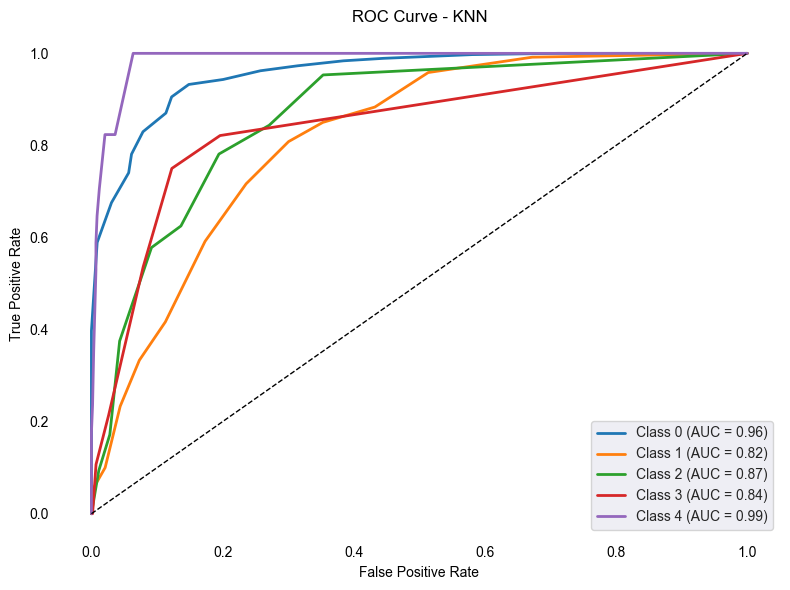

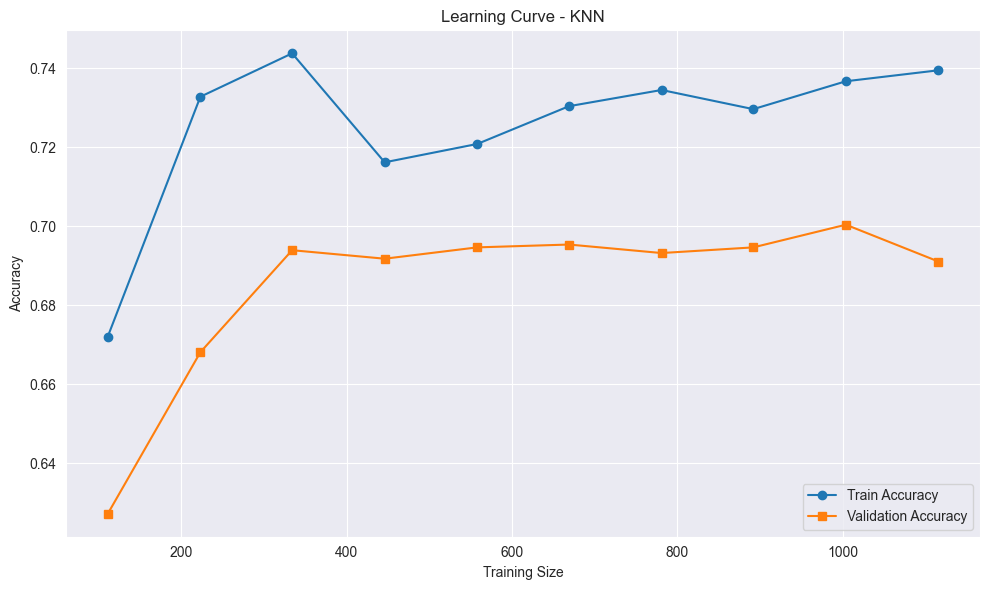

Skipping size=100 due to class imbalance: {1: 23, 0: 60, 4: 4, 3: 5, 2: 8}


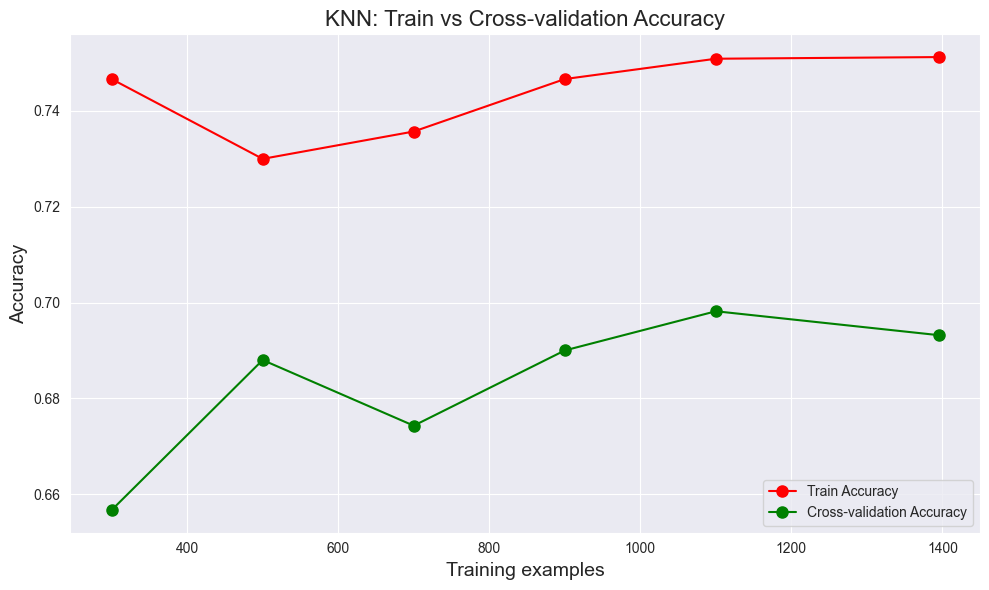

In [31]:
os.environ["LOKY_MAX_CPU_COUNT"] = "4"
warnings.filterwarnings("ignore", message="Could not find the number of physical cores")
os.makedirs("figures", exist_ok=True)

knn_model = KNeighborsClassifier(n_neighbors=16)
knn_model.fit(X_train, y_train)

y_pred = knn_model.predict(X_test)
y_score = knn_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"KNN Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, zero_division=0))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - KNN", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_knn.png", dpi=300, facecolor='white')
plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=knn_model,
    X=X_train,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - KNN")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/knn_learning_curve.png", dpi=300)
plt.show()

cv_train_sizes = [100, 300, 500, 700, 900, 1100, len(X_train)]
cv_train_accuracies = []
cv_valid_accuracies = []
valid_sizes = []

for size in cv_train_sizes:
    X_subset = X_train[:size]
    y_subset = y_train[:size]
    class_counts = Counter(y_subset)
    if any(count < 5 for count in class_counts.values()):
        print(f"Skipping size={size} due to class imbalance: {dict(class_counts)}")
        continue

    model = KNeighborsClassifier(n_neighbors=11)
    model.fit(X_subset, y_subset)

    train_acc = model.score(X_subset, y_subset)
    cv_acc = cross_val_score(model, X_subset, y_subset, cv=5).mean()

    cv_train_accuracies.append(train_acc)
    cv_valid_accuracies.append(cv_acc)
    valid_sizes.append(size)

plt.figure(figsize=(10, 6))
plt.plot(valid_sizes, cv_train_accuracies, 'ro-', label='Train Accuracy', markersize=8)
plt.plot(valid_sizes, cv_valid_accuracies, 'go-', label='Cross-validation Accuracy', markersize=8)
plt.xlabel("Training examples", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("KNN: Train vs Cross-validation Accuracy", fontsize=16)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/knn_crossval_vs_train.png", dpi=300)
plt.show()


Naive Bayes

Naive Bayes Accuracy: 0.8063

Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.85      0.90       370
           1       0.58      0.72      0.64       120
           2       0.64      0.78      0.70        64
           3       0.71      0.54      0.61        28
           4       0.77      1.00      0.87        17

    accuracy                           0.81       599
   macro avg       0.73      0.78      0.75       599
weighted avg       0.83      0.81      0.81       599



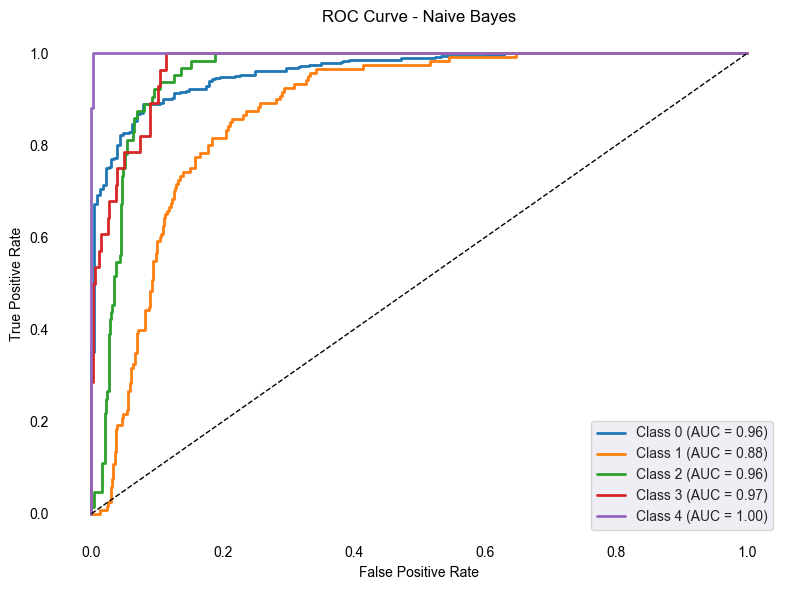

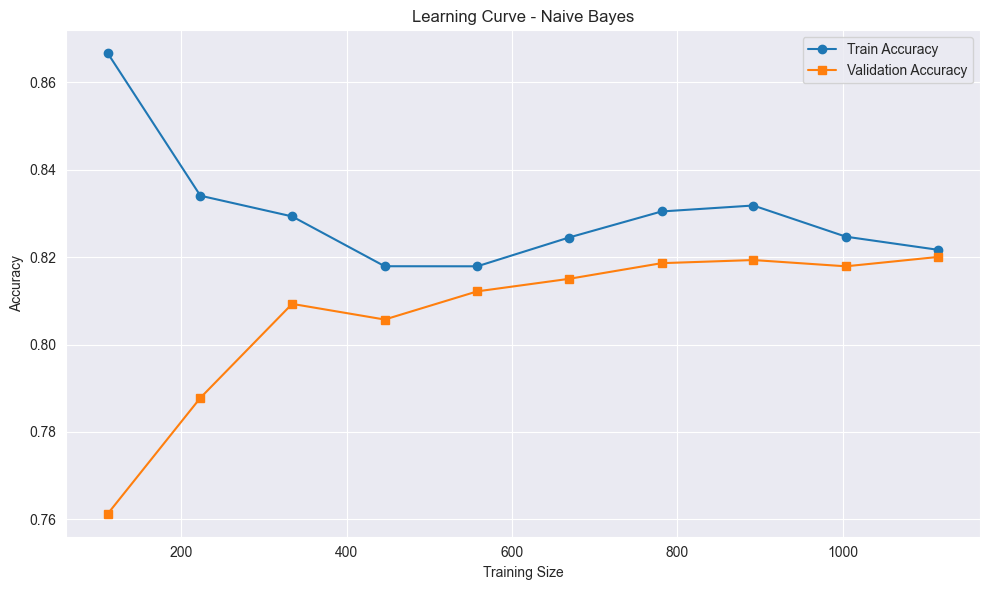

In [32]:
os.makedirs("figures", exist_ok=True)

selector = SelectKBest(score_func=f_classif, k=25)
X_train_sel = selector.fit_transform(X_train, y_train)
X_test_sel = selector.transform(X_test)

smote = SMOTE(random_state=42)
X_train_bal, y_train_bal = smote.fit_resample(X_train_sel, y_train)

nb_model = GaussianNB()
nb_model.fit(X_train_bal, y_train_bal)

y_pred = nb_model.predict(X_test_sel)
y_score = nb_model.predict_proba(X_test_sel)

acc = accuracy_score(y_test, y_pred)
print(f"Naive Bayes Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred, zero_division=0))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - Naive Bayes", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_naive_bayes_improved.png", dpi=300, facecolor='white')
plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=nb_model,
    X=X_train_sel,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Naive Bayes")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_naive_bayes.png", dpi=300)
plt.show()


Gradient Boosting Classifier

Gradient Boosting Accuracy: 0.9816

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       370
           1       1.00      1.00      1.00       120
           2       1.00      1.00      1.00        64
           3       0.90      0.68      0.78        28
           4       0.62      0.88      0.73        17

    accuracy                           0.98       599
   macro avg       0.91      0.91      0.90       599
weighted avg       0.98      0.98      0.98       599



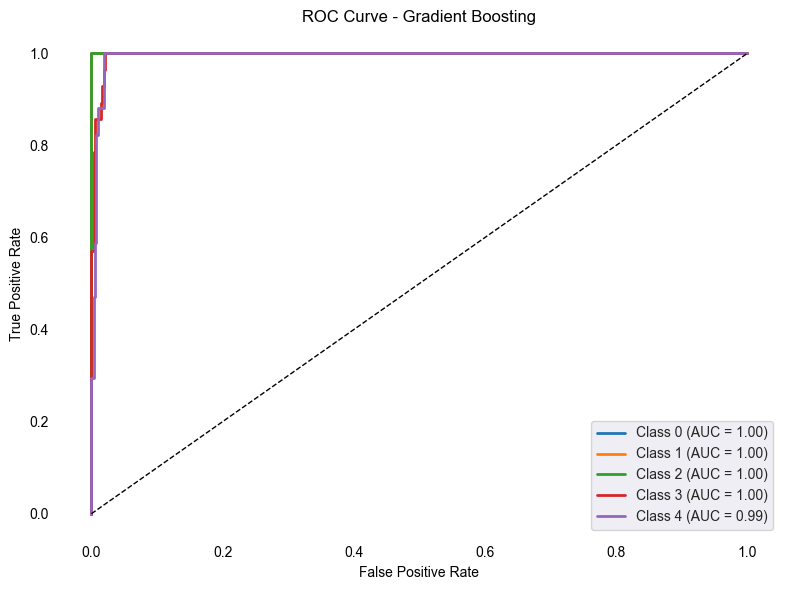

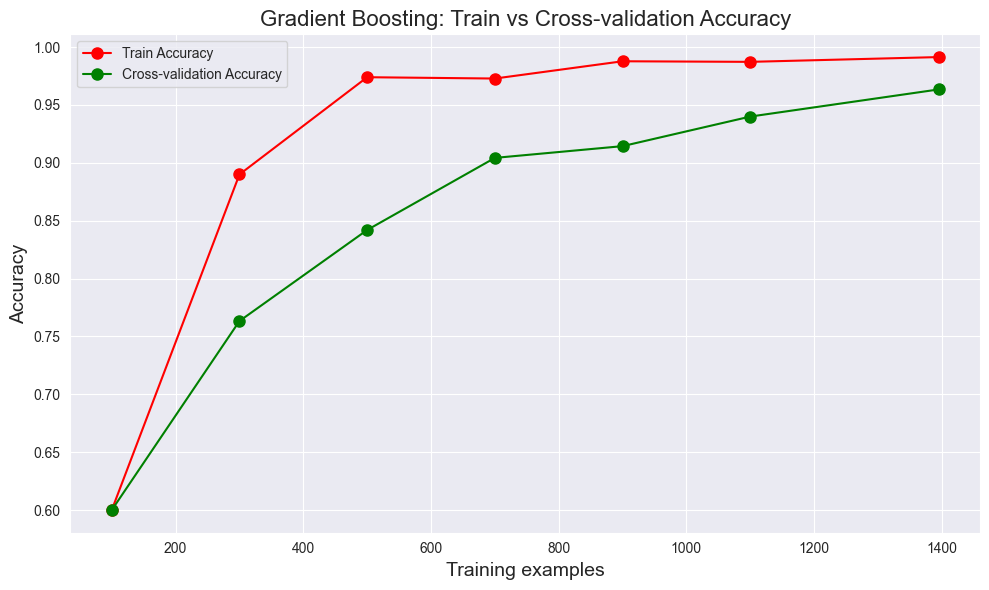

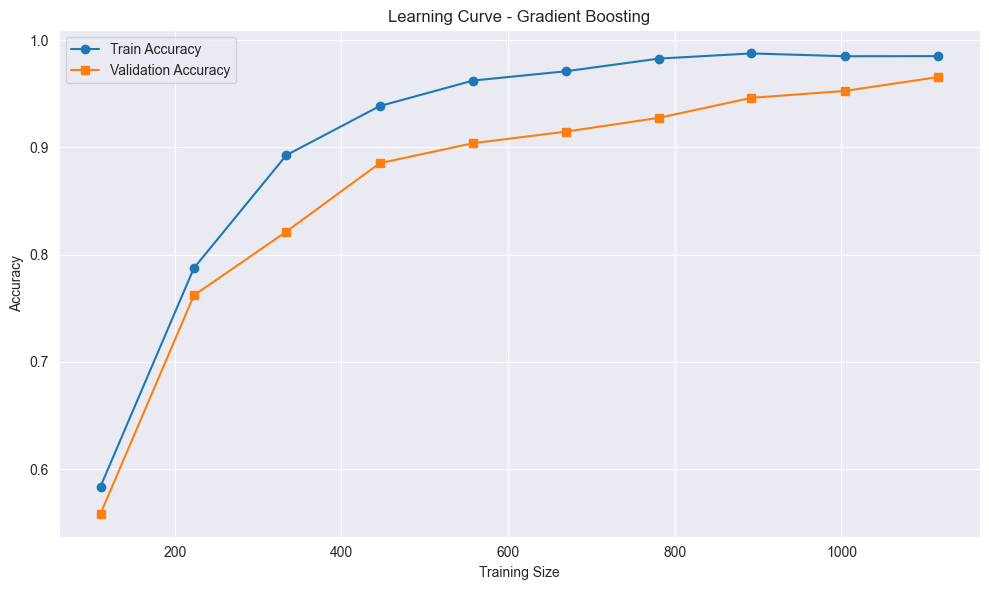

In [83]:
os.makedirs("figures", exist_ok=True)

gb_model = GradientBoostingClassifier(
    n_estimators=3000,
    learning_rate=0.005,
    min_samples_leaf=60,
    min_samples_split=120,
    validation_fraction=0.1,
    n_iter_no_change=30,
    tol=1e-4,
    max_depth=2,
    max_features=0.5,
    subsample=0.6,
    random_state=42
)
gb_model.fit(X_train, y_train)

y_pred = gb_model.predict(X_test)
y_score = gb_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"Gradient Boosting Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - Gradient Boosting", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_gradient_boosting.png", dpi=300, facecolor='white')
plt.show()

train_sizes = [100, 300, 500, 700, 900, 1100, len(X_train)]
train_accuracies = []
cv_accuracies = []

for size in train_sizes:
    X_subset = X_train[:size]
    y_subset = y_train[:size]
    _, class_counts = np.unique(y_subset, return_counts=True)
    n_splits = min(5, class_counts.min())

    model = GradientBoostingClassifier(
        n_estimators=3000,
        learning_rate=0.005,
        min_samples_leaf=60,
        min_samples_split=120,
        validation_fraction=0.1,
        n_iter_no_change=30,
        tol=1e-4,
        max_depth=2,
        max_features=0.5,
        subsample=0.6,
        random_state=42
    )
    model.fit(X_subset, y_subset)
    train_accuracies.append(model.score(X_subset, y_subset))
    cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    cv_accuracies.append(cross_val_score(model, X_subset, y_subset, cv=cv, n_jobs=-1).mean())

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_accuracies, 'ro-', label='Train Accuracy', markersize=8)
plt.plot(train_sizes, cv_accuracies, 'go-', label='Cross-validation Accuracy', markersize=8)
plt.xlabel("Training examples", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("Gradient Boosting: Train vs Cross-validation Accuracy", fontsize=16)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/train_vs_cv_gradient_boosting.png", dpi=300)
plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=gb_model,
    X=X_train_sel,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Gradient Boosting")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_gradient_boosting.png", dpi=300)
plt.show()


Catbooster

CatBoost Accuracy: 0.9900

Classification Report:

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       370
           1       0.95      1.00      0.98       120
           2       1.00      0.91      0.95        64
           3       1.00      1.00      1.00        28
           4       1.00      1.00      1.00        17

    accuracy                           0.99       599
   macro avg       0.99      0.98      0.99       599
weighted avg       0.99      0.99      0.99       599



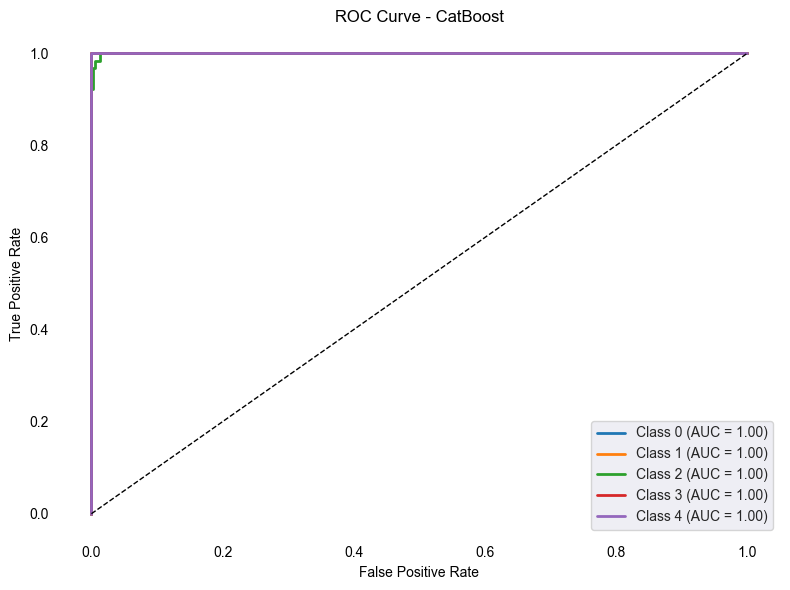

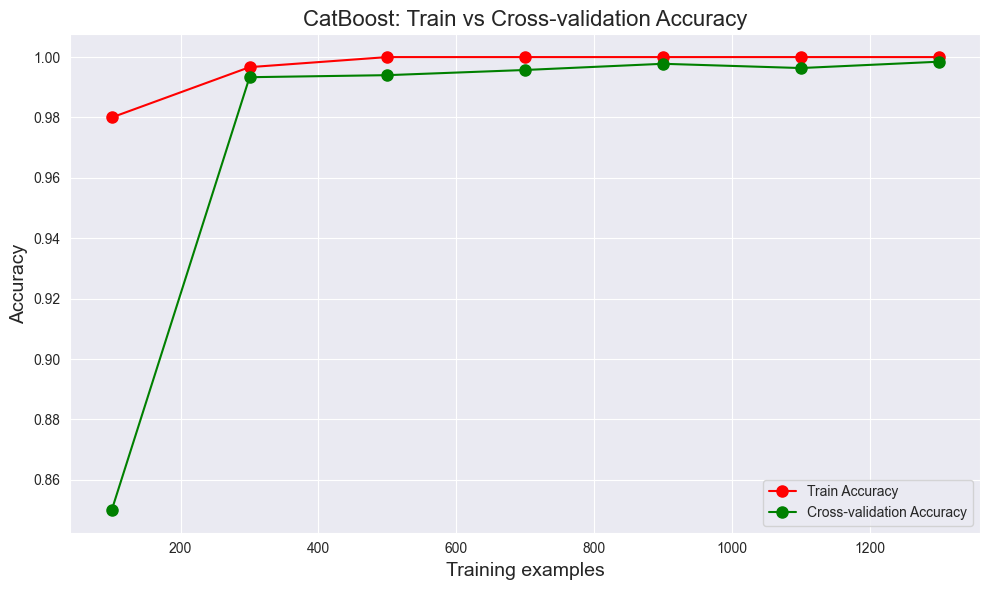

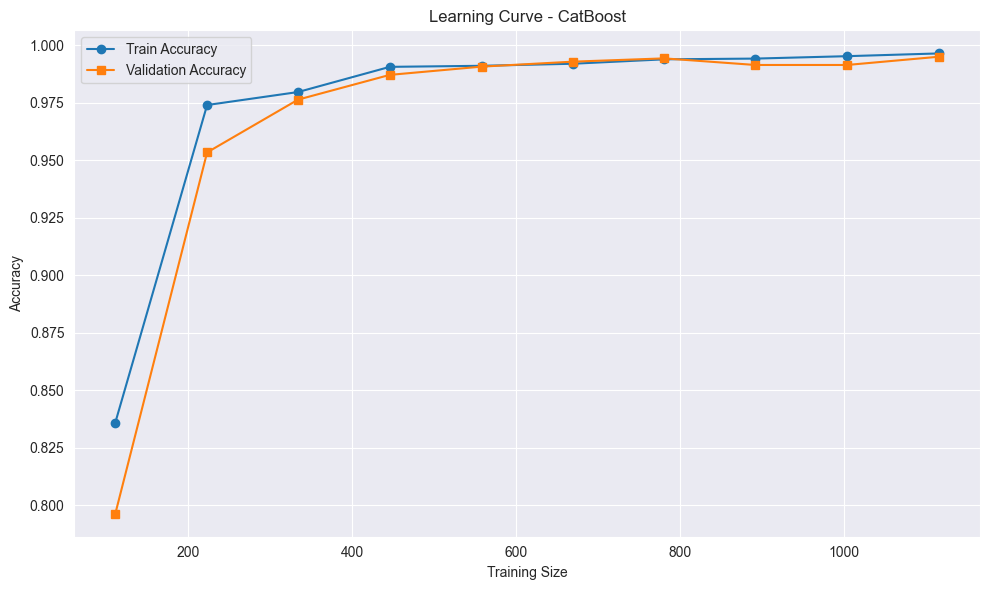

In [85]:
os.makedirs("figures", exist_ok=True)
warnings.filterwarnings("ignore", category=UserWarning)

cat_model = CatBoostClassifier(
    verbose=0,
    depth=1,
    learning_rate=0.02,
    l2_leaf_reg=10,
    bootstrap_type='Bayesian',
    iterations=300,
    early_stopping_rounds=30,
    random_state=42,
    rsm=0.7
)


cat_model.fit(X_train, y_train)

y_pred = cat_model.predict(X_test)
y_score = cat_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"CatBoost Accuracy: {acc:.4f}")
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - CatBoost", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_catboost.png", dpi=300, facecolor='white')
plt.show()

train_sizes = [100, 300, 500, 700, 900, 1100, 1300]
train_accuracies = []
cv_accuracies = []
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)

for size in train_sizes:
    X_subset = X_train[:size]
    y_subset = y_train[:size]
    model = CatBoostClassifier(
        verbose=0,
        depth=3,
        learning_rate=0.02,
        l2_leaf_reg=20,
        bootstrap_type='Bayesian',
        iterations=400,
        early_stopping_rounds=40,
        random_state=42,
        rsm=0.7
    )
    model.fit(X_subset, y_subset)
    train_accuracies.append(model.score(X_subset, y_subset))
    cv_accuracies.append(cross_val_score(model, X_subset, y_subset, cv=cv, n_jobs=-1).mean())

plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_accuracies, 'ro-', label='Train Accuracy', markersize=8)
plt.plot(train_sizes, cv_accuracies, 'go-', label='Cross-validation Accuracy', markersize=8)
plt.xlabel("Training examples", fontsize=14)
plt.ylabel("Accuracy", fontsize=14)
plt.title("CatBoost: Train vs Cross-validation Accuracy", fontsize=16)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/train_vs_cv_catboost.png", dpi=300)
plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=cat_model,
    X=X_train_sel,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - CatBoost")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_catboost.png", dpi=300)
plt.show()


MLP Classifier

✅ MLPClassifier Accuracy: 0.8865

📊 Classification Report:

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       370
           1       0.80      0.85      0.83       120
           2       0.73      0.77      0.75        64
           3       0.62      0.29      0.39        28
           4       0.70      0.94      0.80        17

    accuracy                           0.89       599
   macro avg       0.76      0.76      0.75       599
weighted avg       0.88      0.89      0.88       599



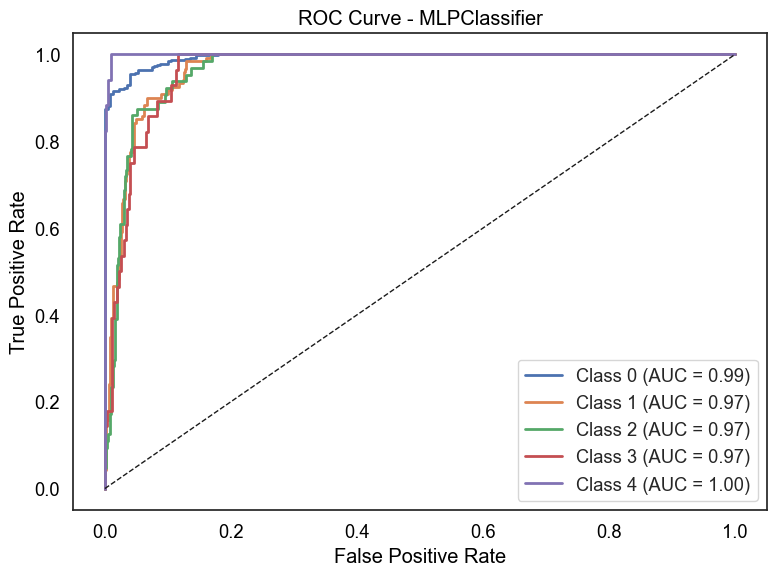

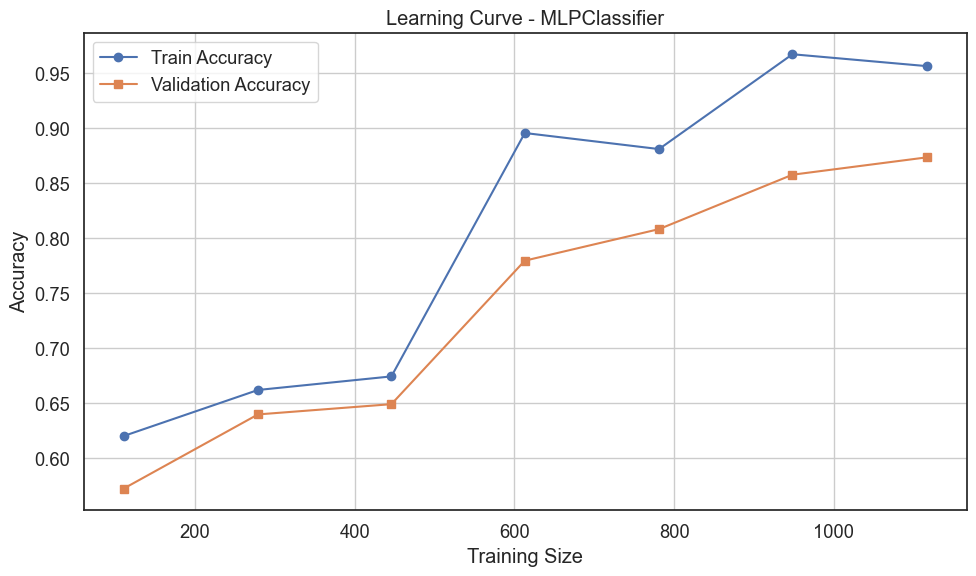

In [ ]:
mlp_model = MLPClassifier(
    hidden_layer_sizes=(80, 40),
    max_iter=1200,
    validation_fraction=0.2,
    alpha=0.12,
    early_stopping=True,
    n_iter_no_change=10,
    random_state=42
)
mlp_model.fit(X_train, y_train)
y_pred = mlp_model.predict(X_test)
y_score = mlp_model.predict_proba(X_test)
acc = accuracy_score(y_test, y_pred)
print(f"✅ MLPClassifier Accuracy: {acc:.4f}")
print("\n📊 Classification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - MLPClassifier", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_mlpclassifier.png", dpi=300, facecolor='white')
plt.show()

train_sizes = np.linspace(0.1, 1.0, 7)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=MLPClassifier(
        hidden_layer_sizes=(80, 40),
        max_iter=1200,
        validation_fraction=0.2,
        alpha=0.12,
        early_stopping=True,
        n_iter_no_change=10,
        random_state=42
    ),
    X=X_train,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - MLPClassifier")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_mlpclassifier.png", dpi=300)
plt.show()


Gaussian Naive_Bayes

✅ Survivorship Naive Bayes Accuracy: 0.7930

📊 Classification Report:

              precision    recall  f1-score   support

           0       0.95      0.84      0.89       370
           1       0.54      0.68      0.60       120
           2       0.63      0.78      0.70        64
           3       0.88      0.54      0.67        28
           4       0.74      1.00      0.85        17

    accuracy                           0.79       599
   macro avg       0.75      0.77      0.74       599
weighted avg       0.82      0.79      0.80       599



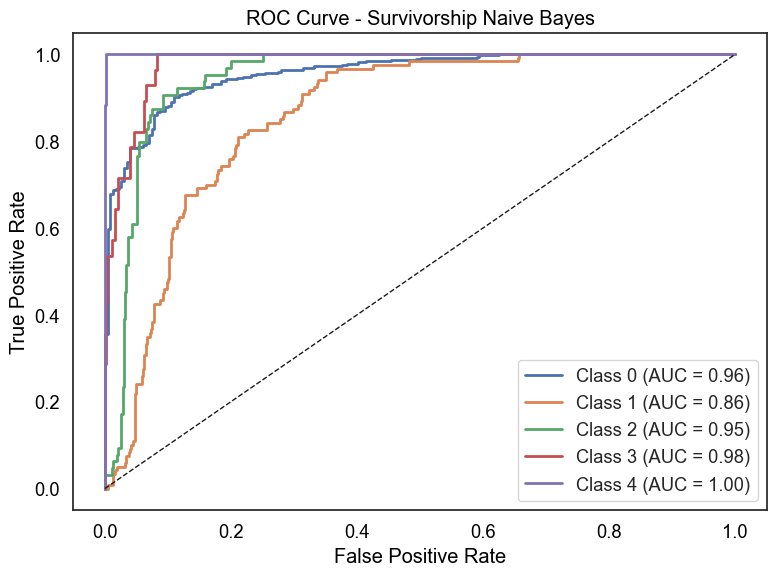

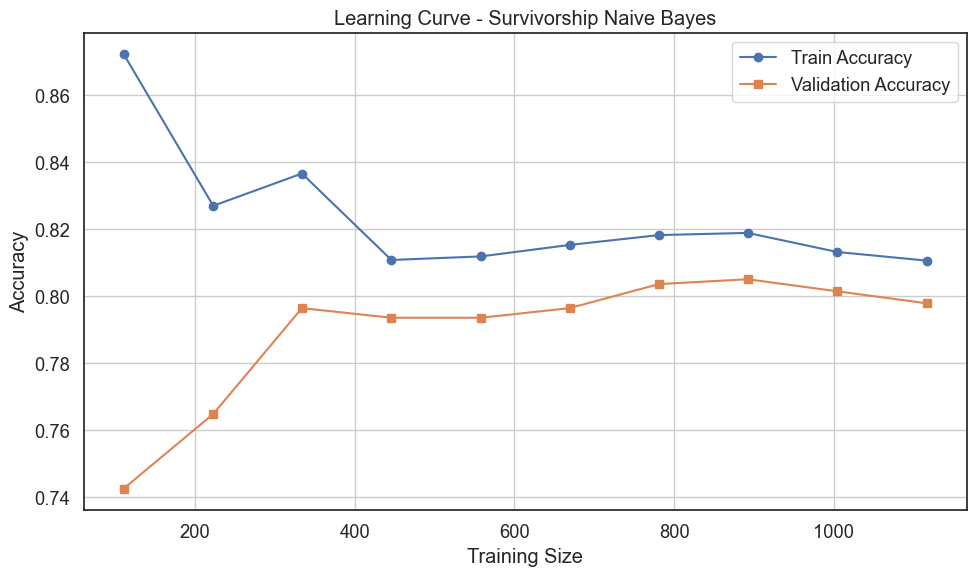

In [ ]:
os.makedirs("figures", exist_ok=True)

class_counts = np.bincount(y_train)
class_priors = class_counts / class_counts.sum()

nb_model = GaussianNB(priors=class_priors)
nb_model.fit(X_train, y_train)

y_pred = nb_model.predict(X_test)
y_score = nb_model.predict_proba(X_test)

acc = accuracy_score(y_test, y_pred)
print(f"✅ Survivorship Naive Bayes Accuracy: {acc:.4f}")
print("\n📊 Classification Report:\n")
print(classification_report(y_test, y_pred))

y_test_bin = label_binarize(y_test, classes=[0, 1, 2, 3, 4])
n_classes = y_test_bin.shape[1]

plt.figure(figsize=(8, 6), facecolor='white')
ax = plt.gca()
ax.set_facecolor('white')
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate", color='black')
plt.ylabel("True Positive Rate", color='black')
plt.title("ROC Curve - Survivorship Naive Bayes", color='black')
ax.tick_params(colors='black')
plt.legend(loc="lower right")
plt.tight_layout()
plt.savefig("figures/roc_survivorship_naive_bayes.png", dpi=300, facecolor='white')
plt.show()

train_sizes = np.linspace(0.1, 1.0, 10)
train_sizes_abs, train_scores, valid_scores = learning_curve(
    estimator=nb_model,
    X=X_train,
    y=y_train,
    train_sizes=train_sizes,
    cv=5,
    scoring='accuracy',
    n_jobs=-1
)

plt.figure(figsize=(10, 6))
plt.plot(train_sizes_abs, train_scores.mean(axis=1), 'o-', label='Train Accuracy')
plt.plot(train_sizes_abs, valid_scores.mean(axis=1), 's-', label='Validation Accuracy')
plt.xlabel("Training Size")
plt.ylabel("Accuracy")
plt.title("Learning Curve - Survivorship Naive Bayes")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_survivorship_naive_bayes.png", dpi=300)
plt.show()


ANN

✅ ANN Test Accuracy: 0.9633
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.98      0.99      0.99       370
           1       0.93      0.95      0.94       120
           2       0.89      0.91      0.90        64
           3       1.00      0.71      0.83        28
           4       0.94      1.00      0.97        17

    accuracy                           0.96       599
   macro avg       0.95      0.91      0.93       599
weighted avg       0.96      0.96      0.96       599



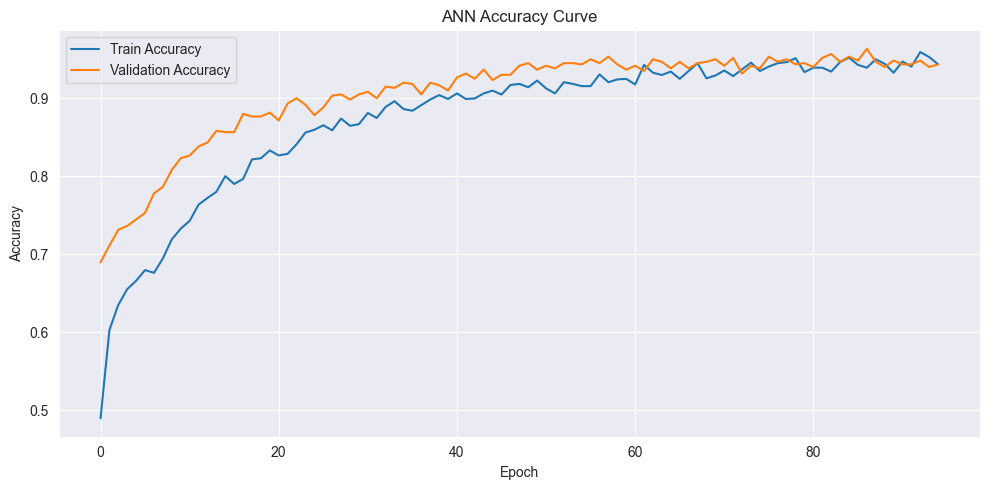

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


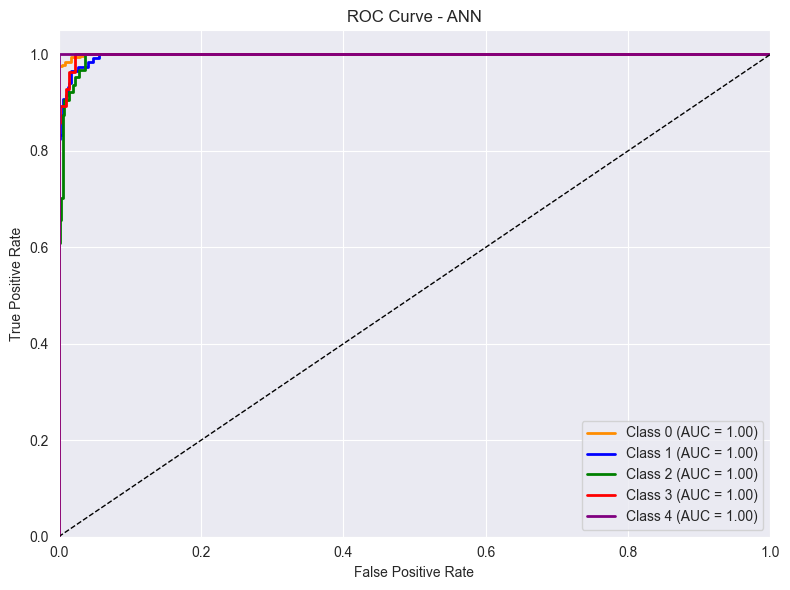

In [86]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model = Sequential()
model.add(Dense(64, input_shape=(X_train_scaled.shape[1],), activation='relu', kernel_regularizer=regularizers.l2(0.002)))
model.add(Dropout(0.4))
model.add(Dense(32, activation='relu', kernel_regularizer=regularizers.l2(0.001)))
model.add(Dropout(0.4))
model.add(Dense(len(np.unique(y_train)), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=100, validation_data=(X_test_scaled, y_test), callbacks=[early_stop], verbose=0)

loss, accuracy = model.evaluate(X_test_scaled, y_test, verbose=0)
print(f"✅ ANN Test Accuracy: {accuracy:.4f}")

y_pred = model.predict(X_test_scaled).argmax(axis=1)
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("ANN Accuracy Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/ann_learning_curve.png", dpi=300)
plt.show()

y_test_bin = label_binarize(y_test, classes=np.unique(y_train))
n_classes = y_test_bin.shape[1]
y_score = model.predict(X_test_scaled)

plt.figure(figsize=(8, 6))
colors = ['darkorange', 'blue', 'green', 'red', 'purple']

for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f"Class {i} (AUC = {roc_auc:.2f})", color=colors[i % len(colors)])

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - ANN")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/roc_ann.png", dpi=300)
plt.show()


CNN

✅ CNN Test Accuracy: 0.8364
19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step

📊 Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95       370
           1       0.68      0.77      0.72       120
           2       0.57      0.52      0.54        64
           3       0.80      0.14      0.24        28
           4       0.73      0.94      0.82        17

    accuracy                           0.84       599
   macro avg       0.74      0.67      0.66       599
weighted avg       0.84      0.84      0.82       599



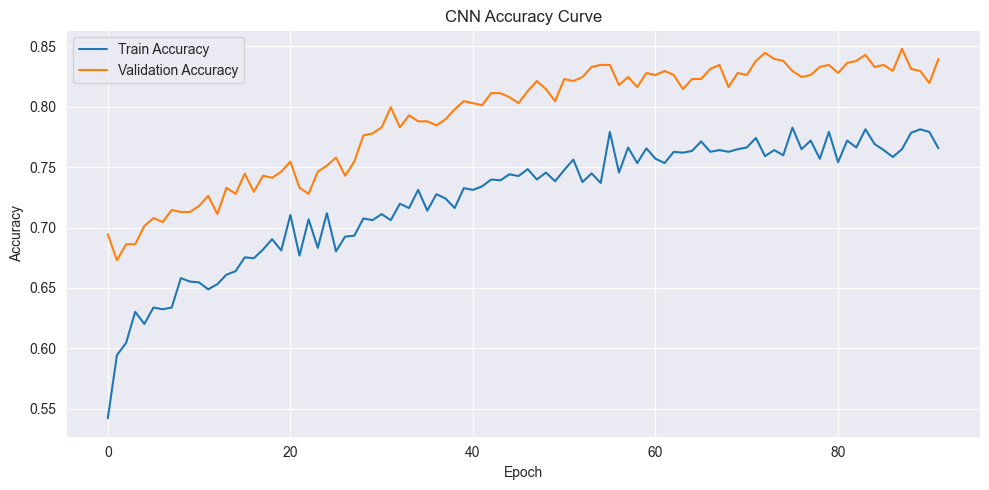

19/19 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


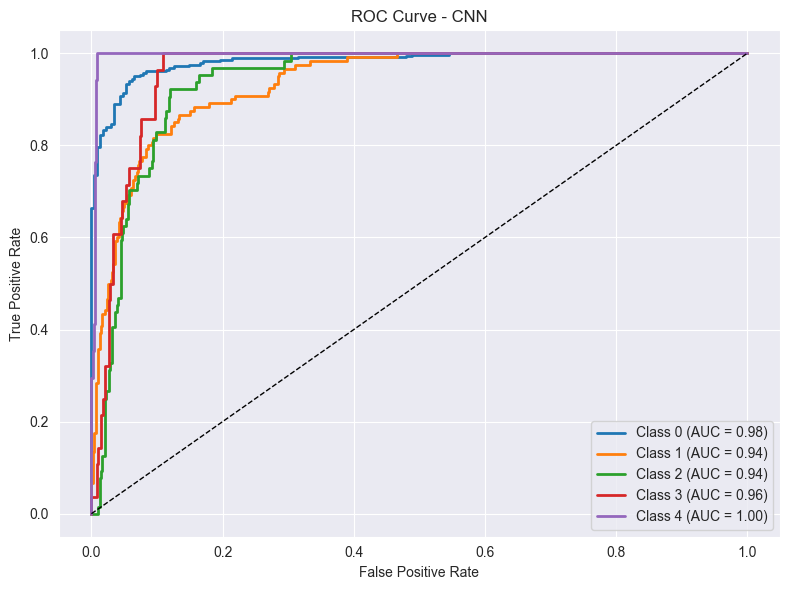

In [87]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_cnn = X_train_scaled[..., np.newaxis]
X_test_cnn = X_test_scaled[..., np.newaxis]

model = Sequential()
model.add(Conv1D(filters=16, kernel_size=3, activation='relu', input_shape=(X_train_cnn.shape[1], 1), kernel_regularizer=regularizers.l2(0.002)))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.4))
model.add(Conv1D(32, 3, activation='relu', kernel_regularizer=regularizers.l2(0.002)))
model.add(MaxPooling1D(pool_size=2))
model.add(Dropout(0.5))
model.add(Flatten())
model.add(Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.002)))
model.add(Dropout(0.5))
model.add(Dense(len(np.unique(y)), activation='softmax'))

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

history = model.fit(X_train_cnn, y_train, epochs=100, validation_data=(X_test_cnn, y_test), callbacks=[early_stop], verbose=0)

loss, accuracy = model.evaluate(X_test_cnn, y_test, verbose=0)
print(f"✅ CNN Test Accuracy: {accuracy:.4f}")

y_pred = model.predict(X_test_cnn).argmax(axis=1)
print("\n📊 Classification Report:\n", classification_report(y_test, y_pred))

plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("CNN Accuracy Curve")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/learning_curve_cnn.png", dpi=300)
plt.show()

y_test_bin = label_binarize(y_test, classes=np.unique(y))
n_classes = y_test_bin.shape[1]
y_score = model.predict(X_test_cnn)

plt.figure(figsize=(8, 6))
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f"Class {i} (AUC = {roc_auc:.2f})", lw=2)

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve - CNN")
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/roc_curve_cnn.png", dpi=300)
plt.show()
